In [1]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# for everything else
import os
import numpy as np
import matplotlib.pyplot as plt
from random import randint
import pandas as pd
import pickle

import torch
import torch.nn as nn
from torchvision import models, transforms

from PIL import Image

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

import pytorch_lightning as pl
from torch.utils.data import DataLoader, TensorDataset
import torch.optim as optim
from pytorch_lightning import Trainer
from RESNET101 import resnet101, ResNet101_Weights
import torch
import numpy as np
import cv2

from sklearn.preprocessing import LabelEncoder
from scipy.stats import mannwhitneyu
from scipy.optimize import linear_sum_assignment
import matplotlib.patches as mpatches
from sklearn.preprocessing import RobustScaler
import igraph as ig
import networkx as nx
import cairo
import community.community_louvain as cl
from sklearn.neighbors import kneighbors_graph
import sknetwork as skn
from sknetwork.clustering import Louvain
from sklearn.metrics import adjusted_rand_score
import seaborn as sns


from torch.utils.data import DataLoader, TensorDataset, Subset
from sklearn.model_selection import StratifiedKFold
import torch.optim as optim
import pytorch_lightning as pl

In [2]:
data_folder = '/home/deev/t-simcne/CAP-CNN/data/simulation_caleb'
folders = ['group1', 'group2', 'group3', 'group4']
file_list = []
annotations = []

for folder in folders:
    folder_path = os.path.join(data_folder, folder)
    
    if os.path.exists(folder_path):
        #List all files in the folder
        files = os.listdir(folder_path)
        
        #Add filenames to the file_list and annotations to the annotations list
        file_list.extend([os.path.join(folder_path, file) for file in files])
        annotations.extend([folder] * len(files))

print("File List:", file_list)
print("Annotations:", annotations)    

print(len(file_list))
print(len(annotations))

File List: ['/home/deev/t-simcne/CAP-CNN/data/simulation_caleb/group1/cell11', '/home/deev/t-simcne/CAP-CNN/data/simulation_caleb/group1/cell5', '/home/deev/t-simcne/CAP-CNN/data/simulation_caleb/group1/cell7', '/home/deev/t-simcne/CAP-CNN/data/simulation_caleb/group1/cell6', '/home/deev/t-simcne/CAP-CNN/data/simulation_caleb/group1/cell13', '/home/deev/t-simcne/CAP-CNN/data/simulation_caleb/group1/cell8', '/home/deev/t-simcne/CAP-CNN/data/simulation_caleb/group1/cell12', '/home/deev/t-simcne/CAP-CNN/data/simulation_caleb/group1/cell10', '/home/deev/t-simcne/CAP-CNN/data/simulation_caleb/group1/cell16', '/home/deev/t-simcne/CAP-CNN/data/simulation_caleb/group1/cell18', '/home/deev/t-simcne/CAP-CNN/data/simulation_caleb/group1/cell3', '/home/deev/t-simcne/CAP-CNN/data/simulation_caleb/group1/cell14', '/home/deev/t-simcne/CAP-CNN/data/simulation_caleb/group1/cell4', '/home/deev/t-simcne/CAP-CNN/data/simulation_caleb/group1/cell17', '/home/deev/t-simcne/CAP-CNN/data/simulation_caleb/group

In [3]:
true_labels = np.array(annotations)

In [4]:
group_to_num = {'group1': 0, 'group2': 1, 'group3': 2, 'group4': 3}
numeric_labels = np.array([group_to_num[g] for g in true_labels])
unique_labels = set(numeric_labels)

In [5]:
transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

In [6]:
#Load the pre-trained ResNet101 model
resnet101 = models.resnet101(pretrained=True)

# Remove the final fully connected layer (fc) to get the 2048-dimensional feature vector
resnet101.fc = torch.nn.Identity()

/home/deev/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/deev/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [7]:
def extract_features(file, model):
    #Load the image as a 224x224 array
    input_image = Image.open(file).convert("RGB")

    #NEW: padding--target size (224x224) and create a black background
    target_size = (224, 224)
    background = Image.new("RGB", target_size, (0, 0, 0))  # Black background

    #Get the size of the input image
    input_width, input_height = input_image.size

    #Calculate the position to paste the image at the center
    x_offset = (target_size[0] - input_width) // 2
    y_offset = (target_size[1] - input_height) // 2

    #Paste the input image onto the black background
    background.paste(input_image, (x_offset, y_offset))

    #Prepare image for model
    input_tensor = transform(background)
    input_batch = input_tensor.unsqueeze(0) # Create a mini-batch as expected by the model

    #Get the feature vector and extract features
    with torch.no_grad():
        features = model(input_batch)

    return features

In [8]:
features_stack = []
images_order = [] # To track (cell_id, [list of hybridizations])
gene_hybridization_names = ["gene1", "gene2", "gene3"]

for img in file_list:
    features_list = []
    hybridizations_list = [] 
    # Extract the cell identifier from the file path
    cell_id = img.split('/')[-1]  # e.g., "3243", "1560"


    for file in os.listdir(img):
        #Skip segmentation files
        if "cell_seg" in file:
            continue
        # Track if a valid gene hybridization was found
        matched = False

        for hybridization in gene_hybridization_names:  # Loop through full hybridization names
            if hybridization in file: #Check if the exact hybridization is in the filename
                feat = extract_features(os.path.join(img, file), resnet101) 
                features_list.append(np.array(feat.squeeze()))
                hybridizations_list.append(hybridization)
                matched = True
                break  # Stop searching once we find a match
        #If no valid gene hybridization was found in this file, print a warning
        if not matched:
            print(os.path.join(img, file))
            print(f"Warning: Unmatched file (not a gene hybridization) → {file}")
    

    if features_list:  #Ensure features exist before concatenation
        features_stack.append(np.concatenate(features_list, axis=0))
        images_order.append((cell_id, hybridizations_list))  # Track cell ID & hybridizations
        

# onvert list to numpy array
features_stack = np.stack(features_stack)

print(features_stack.shape)  #Expected shape: (num_cells, 2048 * num_hybridizations)

(80, 6144)


In [9]:
#Perform PCA
pca = PCA(n_components=5, random_state=22)
pca.fit(features_stack)
pcs = pca.transform(features_stack)

In [10]:
#t-SNE dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
embedding = tsne.fit_transform(pcs)

In [11]:
filenames = np.array(file_list)

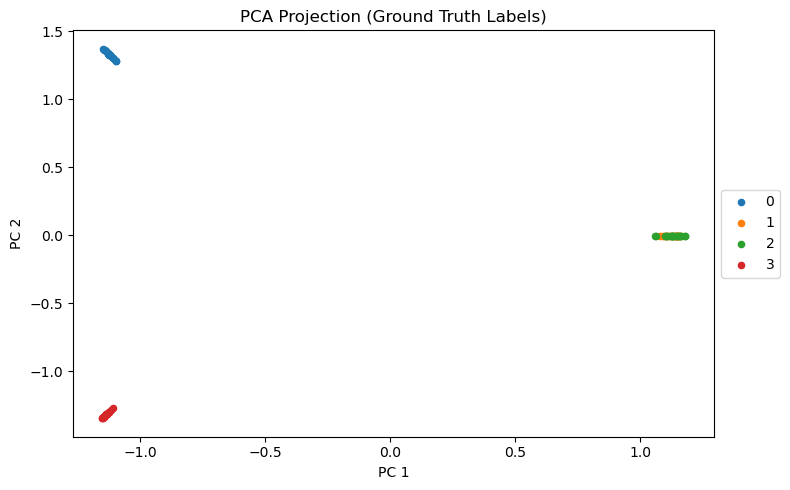

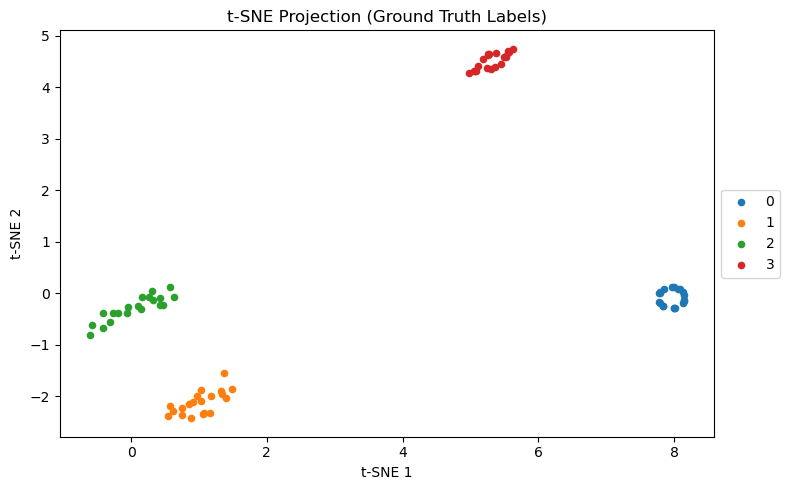

In [12]:
# --- PCA PLOT WITH TRUE LABELS ---
plt.figure(figsize=(8, 5))
for group_label in np.unique(numeric_labels):
    # Create a boolean mask for the rows belonging to this group
    mask = (numeric_labels == group_label)
    plt.scatter(
        pcs[mask, 0],   # PCA dimension 1
        pcs[mask, 1],   # PCA dimension 2
        label=group_label,
        s=20
    )
plt.title('PCA Projection (Ground Truth Labels)')
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

# --- TSNE PLOT WITH TRUE LABELS ---
plt.figure(figsize=(8, 5))
for group_label in np.unique(numeric_labels):
    mask = (numeric_labels == group_label)
    plt.scatter(
        embedding[mask, 0],  # t-SNE dimension 1
        embedding[mask, 1],  # t-SNE dimension 2
        label=group_label,
        s=20
    )
plt.title('t-SNE Projection (Ground Truth Labels)')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

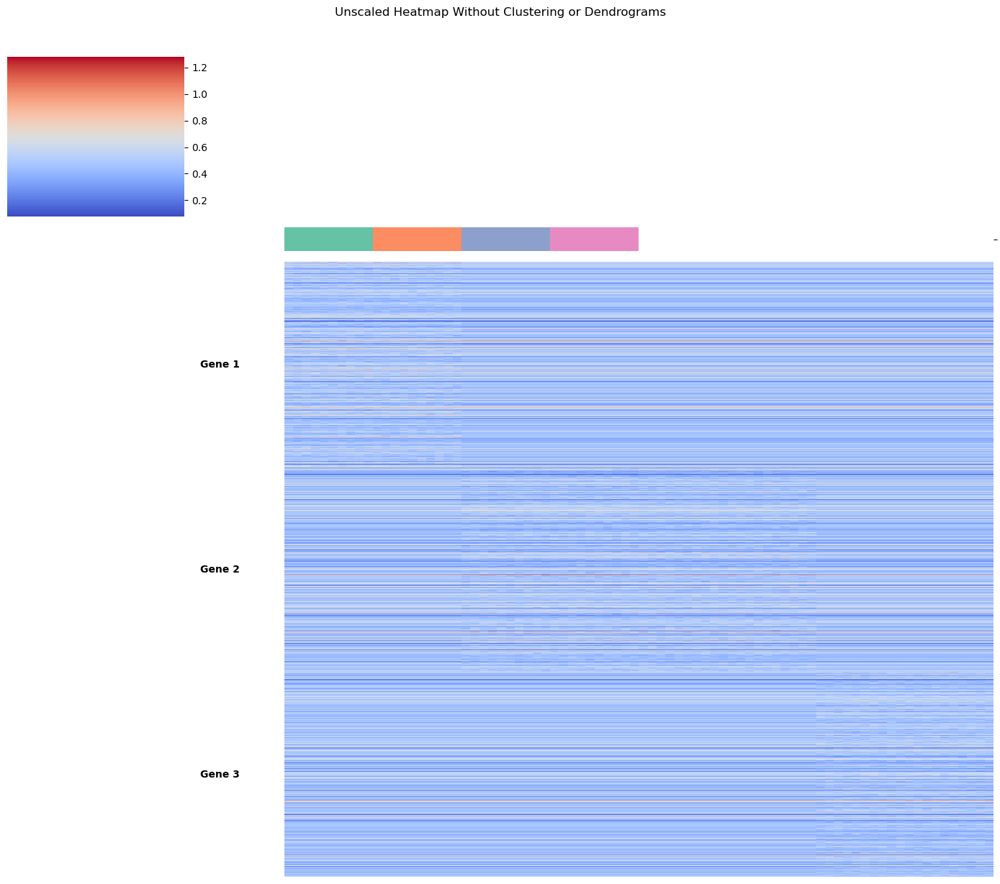

In [21]:
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import linkage, dendrogram

features_t = features_stack.T
features_df = pd.DataFrame(features_t)

# Label rows by gene and feature number
feature_labels = []
for i in range(3):  # 3 genes
    for j in range(2048):
        feature_labels.append(f"gene{i+1}_f{j}")
features_df.index = feature_labels

# Create gene block labels for annotation
unclustered_blocks = []
gene_label_positions_simple = []

for i in range(3):
    start = i * 2048
    end = (i + 1) * 2048
    subset = features_df.iloc[start:end, :]
    unclustered_blocks.append(subset)
    gene_label_positions_simple.append(len(pd.concat(unclustered_blocks)) - 1024)

# Combine unclustered gene blocks
unclustered_heatmap_df = pd.concat(unclustered_blocks, axis=0)

# Simulate numeric labels for cells (group1–4) and color them
numeric_labels = np.repeat([0, 1, 2, 3], 10)
lut = {0: "#66c2a5", 1: "#fc8d62", 2: "#8da0cb", 3: "#e78ac3"}
col_colors = pd.Series(numeric_labels).map(lut)

# Plot the heatmap (raw values, no scaling, clustering, or dendrograms)
g = sns.clustermap(
    unclustered_heatmap_df,
    row_cluster=False,
    col_cluster=False,
    col_colors=col_colors,
    cmap="coolwarm",
    xticklabels=False,
    yticklabels=False,
    figsize=(14, 12)
)

# Annotate gene blocks
ax = g.ax_heatmap
for idx, pos in enumerate(gene_label_positions_simple):
    ax.text(-5, pos, f"Gene {idx+1}", va='center', ha='right', fontsize=10, rotation=0, fontweight='bold')

plt.suptitle("Unscaled Heatmap Without Clustering or Dendrograms", y=1.02)
plt.tight_layout()
plt.show()

In [23]:
features_t = features_stack.T
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features_t)
features_df = pd.DataFrame(features_scaled)

# Create feature labels
feature_labels = []
for i in range(3):  # 3 genes
    for j in range(2048):
        feature_labels.append(f"gene{i+1}_f{j}")
features_df.index = feature_labels

#Create gene blocks without clustering
unclustered_blocks = []
gene_label_positions_simple = []

for i in range(3):
    start = i * 2048
    end = (i + 1) * 2048
    subset = features_df.iloc[start:end, :]
    unclustered_blocks.append(subset)
    gene_label_positions_simple.append(len(pd.concat(unclustered_blocks)) - 1024)

# Combine blocks
unclustered_heatmap_df = pd.concat(unclustered_blocks, axis=0)

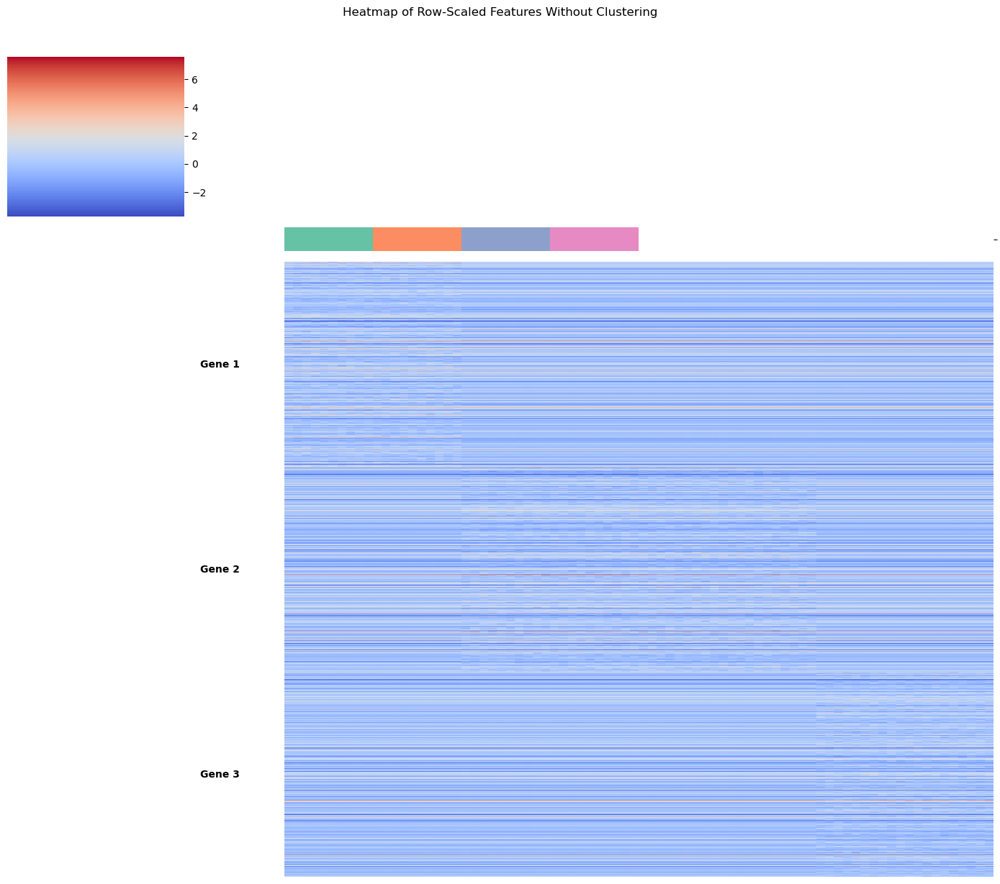

In [24]:
# Color code columns by cluster
lut = {0: "#66c2a5", 1: "#fc8d62", 2: "#8da0cb", 3: "#e78ac3"}
col_colors = pd.Series(numeric_labels).map(lut)

# Plot clustermap without clustering
g = sns.clustermap(
    unclustered_heatmap_df,
    row_cluster=False,
    col_cluster=False,
    col_colors=col_colors,
    cmap="coolwarm",
    xticklabels=False,
    yticklabels=False,
    figsize=(14, 12)
)

# Add gene labels to side
ax = g.ax_heatmap
for idx, pos in enumerate(gene_label_positions_simple):
    ax.text(-5, pos, f"Gene {idx+1}", va='center', ha='right', fontsize=10, rotation=0, fontweight='bold')

plt.suptitle("Heatmap of Row-Scaled Features Without Clustering", y=1.02)
plt.tight_layout()
plt.show()

In [25]:
# features_stack.shape = (80, 6144)
# numeric_labels = 1D array of length n_cells with cluster labels from 0–3

# Transpose → rows = features (6144), columns = cells
features_t = features_stack.T  # shape = (6144, 80)

# SRow-scaling (z-score across cells for each feature)
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features_t)

# Generate row clustering (within each gene block)
# Create a DataFrame to make things easier
features_df = pd.DataFrame(features_scaled)

# Row labels for genes/features
feature_labels = []
for i in range(3):  # 3 genes
    feature_labels.extend([f"gene{i+1}_f{j}" for j in range(2048)])
features_df.index = feature_labels

In [26]:
# Cluster each gene separately and concatenate re-ordered rows
clustered_features = []

for i in range(3):
    start = i * 2048
    end = (i + 1) * 2048
    subset = features_df.iloc[start:end, :]
    
    # Hierarchical clustering linkage
    linkage_rows = linkage(subset, method='ward', metric='euclidean')
    
    # Get row order from dendrogram
    dendro = dendrogram(linkage_rows, no_plot=True)
    row_order = dendro['leaves']
    
    # Append reordered block
    clustered_features.append(subset.iloc[row_order, :])

# Final reordered DataFrame
heatmap_df = pd.concat(clustered_features, axis=0)

# Step 5: Create a color strip for column clusters
lut = {
    0: "#66c2a5",  # greenish
    1: "#fc8d62",  # orange
    2: "#8da0cb",  # blue
    3: "#e78ac3"   # pink
}
col_colors = pd.Series(numeric_labels).map(lut)

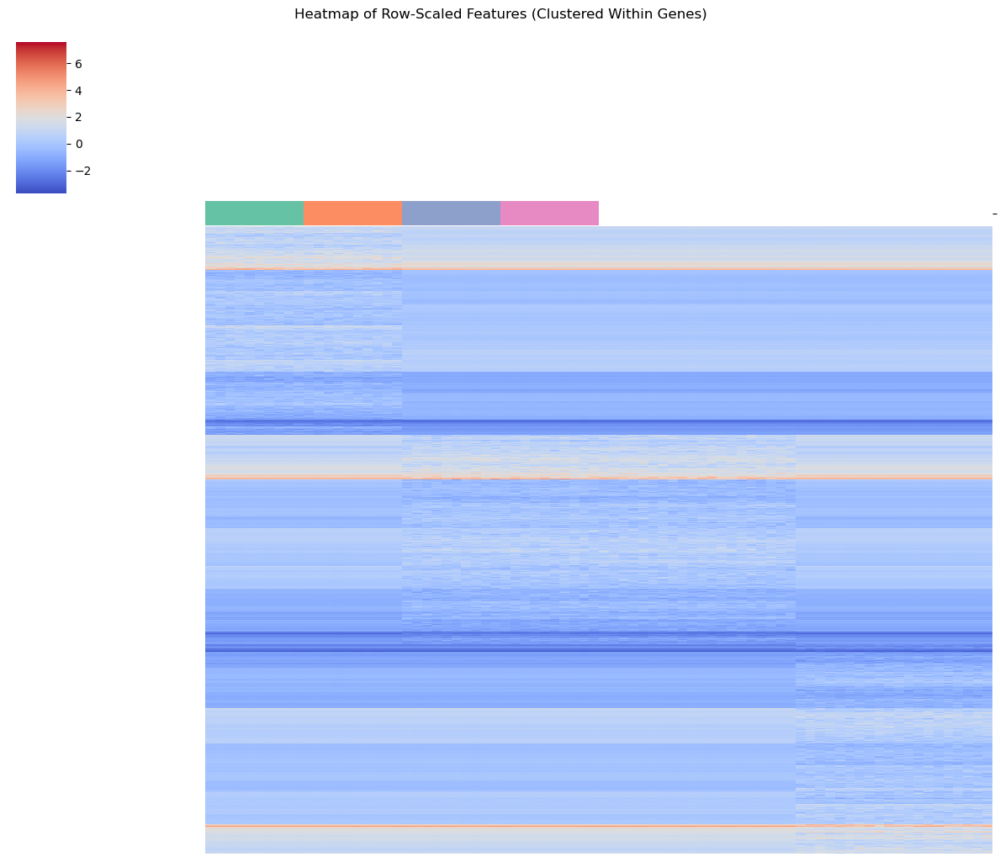

In [27]:
# Plot heatmap
g = sns.clustermap(
    heatmap_df,
    row_cluster=False,  # already clustered
    col_cluster=False,  # disable column clustering
    col_colors=col_colors,
    cmap="coolwarm",     # 'coolwarm' / 'vlag' for diverging
    xticklabels=False,
    yticklabels=False,
    figsize=(12, 10)
)

plt.suptitle("Heatmap of Row-Scaled Features (Clustered Within Genes)", y=1.02)
plt.show()

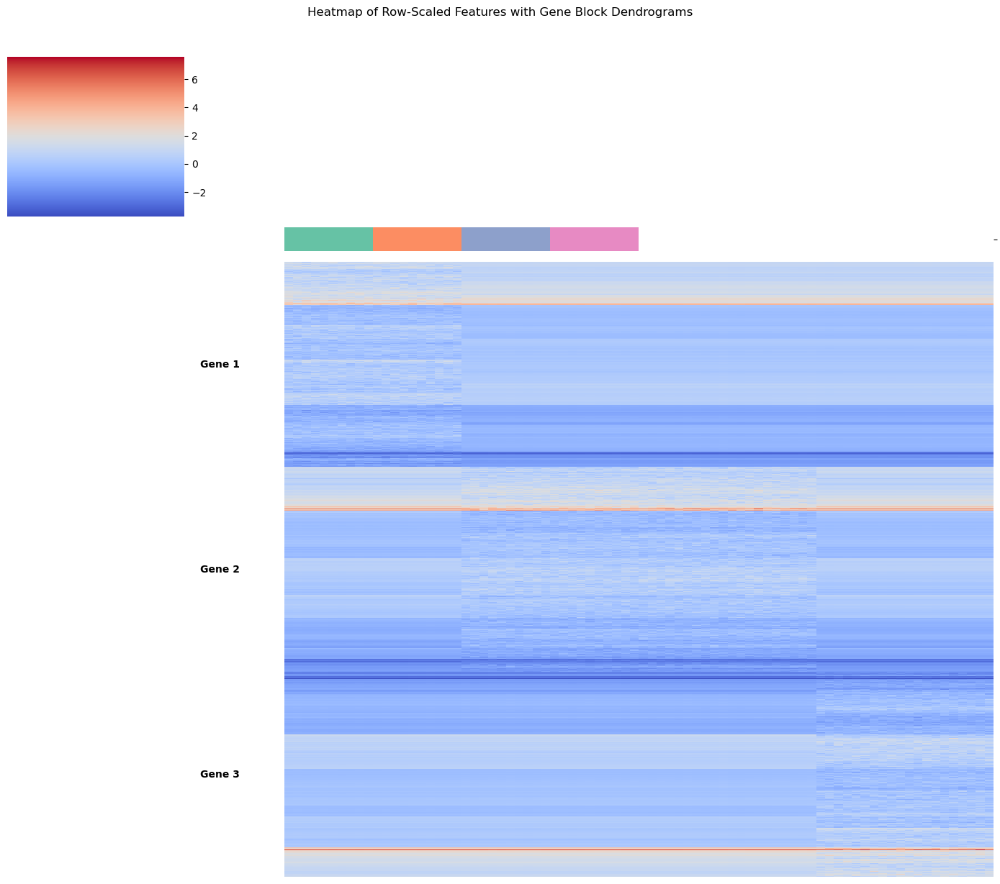

In [28]:
# Transpose and scale features
features_t = features_stack.T
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features_t)
features_df = pd.DataFrame(features_scaled)

# Label each feature by gene and feature number
feature_labels = []
gene_labels = []
for i in range(3):  # 3 genes
    for j in range(2048):
        feature_labels.append(f"gene{i+1}_f{j}")
        gene_labels.append(f"gene{i+1}")
features_df.index = feature_labels

# Hierarchical clustering within each gene
clustered_features = []
row_dendrograms = []
gene_label_positions = []

for i in range(3):
    start = i * 2048
    end = (i + 1) * 2048
    subset = features_df.iloc[start:end, :]

    linkage_rows = linkage(subset, method='ward', metric='euclidean')
    dendro = dendrogram(linkage_rows, no_plot=True)
    row_order = dendro['leaves']
    reordered_subset = subset.iloc[row_order, :]
    clustered_features.append(reordered_subset)

    # Track where to place the gene label
    gene_label_positions.append(len(pd.concat(clustered_features)) - 1024)

# Combine reordered feature blocks
heatmap_df = pd.concat(clustered_features, axis=0)

# Assign column colors for clusters
lut = {0: "#66c2a5", 1: "#fc8d62", 2: "#8da0cb", 3: "#e78ac3"}
col_colors = pd.Series(numeric_labels).map(lut)

# Plot heatmap
g = sns.clustermap(
    heatmap_df,
    row_cluster=False,
    col_cluster=False,
    col_colors=col_colors,
    cmap="coolwarm",
    xticklabels=False,
    yticklabels=False,
    figsize=(14, 12)
)

# Add horizontal gene labels
ax = g.ax_heatmap
for idx, pos in enumerate(gene_label_positions):
    ax.text(-5, pos, f"Gene {idx+1}", va='center', ha='right', fontsize=10, rotation=0, fontweight='bold')

plt.suptitle("Heatmap of Row-Scaled Features with Gene Block Dendrograms", y=1.02)
plt.tight_layout()
plt.show()

/tmp/ipykernel_1154839/2445019504.py:50: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



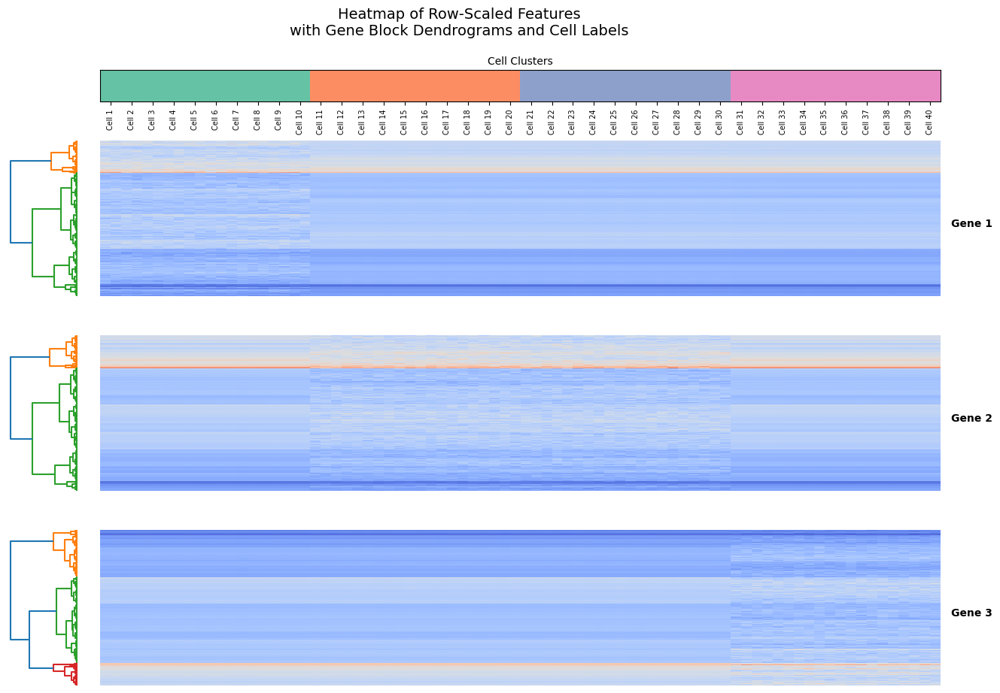

In [29]:
from matplotlib.colors import to_rgb
from matplotlib.gridspec import GridSpec

# Convert hex colors to RGB format for imshow
col_colors_rgb = np.array([to_rgb(c) for c in col_colors])

# Prepare figure manually for full customization
fig = plt.figure(figsize=(16, 14))
gs = GridSpec(5, 2, width_ratios=[1, 12], height_ratios=[0.2, 1, 1, 1, 1], hspace=0.3, wspace=0.05)

# Plot top colorbar for column clusters
ax_colorbar = fig.add_subplot(gs[0, 1])
ax_colorbar.imshow([col_colors_rgb], aspect='auto')
ax_colorbar.set_xticks(np.arange(len(col_colors)))
ax_colorbar.set_xticklabels([f"Cell {i+1}" for i in range(len(col_colors))], rotation=90, fontsize=7)
ax_colorbar.set_yticks([])
ax_colorbar.set_title("Cell Clusters", fontsize=10)

# Plot each gene block with dendrogram and heatmap
for i in range(3):
    start = i * 2048
    end = (i + 1) * 2048
    subset = features_df.iloc[start:end, :]

    # Dendrogram
    linkage_rows = linkage(subset, method='ward', metric='euclidean')
    dendro_ax = fig.add_subplot(gs[i+1, 0])
    dendro = dendrogram(linkage_rows, orientation='left', no_labels=True, ax=dendro_ax, color_threshold=None)
    dendro_ax.invert_yaxis()
    dendro_ax.axis('off')

    # Reorder heatmap based on dendrogram
    row_order = dendro['leaves']
    reordered_subset = subset.iloc[row_order, :]

    heatmap_ax = fig.add_subplot(gs[i+1, 1])
    sns.heatmap(
        reordered_subset,
        ax=heatmap_ax,
        #cmap="viridis",
        cmap="coolwarm",
        cbar=False,
        xticklabels=False,
        yticklabels=False
    )
    heatmap_ax.set_ylabel(f"Gene {i+1}", rotation=0, labelpad=30, fontsize=10, weight='bold')
    heatmap_ax.yaxis.set_label_position("right")

plt.suptitle("Heatmap of Row-Scaled Features\nwith Gene Block Dendrograms and Cell Labels", y=0.94, fontsize=14)
plt.tight_layout()
plt.show()

In [20]:
import plotly.graph_objects as go

# Create the heatmap using go.Heatmap
fig = go.Figure(data=go.Heatmap(
    z=heatmap_df.values,
    x=[f"Cell {i+1}" for i in range(heatmap_df.shape[1])],
    y=heatmap_df.index.tolist(),
    colorscale="viridis",
    colorbar=dict(title="Z-score"),
    hovertemplate="Feature: %{y}<br>Cell: %{x}<br>Z-score: %{z:.2f}<extra></extra>"
))

# Layout settings
fig.update_layout(
    title="Interactive Heatmap of Row-Scaled Features (Clustered Within Genes)",
    xaxis_title="Cells",
    yaxis_title="Clustered Features (by Gene)",
    height=1000,
    width=1200,
    yaxis=dict(autorange="reversed")
)

fig.show()